# MUSA550 Geospatial Data Science in Python - Assignment 2
### Hang Zhao, Collaborated with George Chen

# Part 1: Load the datasets and prepare for plotting

In [1]:
# Let's setup the imports we'll need first

import altair as alt
import numpy as np
import pandas as pd
import seaborn as sns
from matplotlib import pyplot as plt


In [27]:
# import air quality index data
aqi_days = pd.read_csv("./MUSA_550/data/air_quality_index_days.csv")

# import philly shooting data
shooting = pd.read_csv("./MUSA_550/data/shootings.csv")

# import heat vulnerability index data
heat_index = pd.read_csv("./MUSA_550/data/HEAT_EXPOSURE_CENSUS_TRACT.csv")

In [3]:
# adjust the shooting data to 5000 random samples for altair specifically
shooting_5000 = shooting.sample(n=5000)

In [24]:
result = shooting_5000.groupby('wound')['dist'].aggregate(['mean','median'])

In [5]:
heat_index.head(n=10)

,OBJECTID,GEOID10,NAME10,N_VERYHIGH,YEAR,HSI_SCORE,HEI_SCORE,HVI_SCORE,Shape__Area,Shape__Length
0,1,42101019000,190.0,0,2023,0.428964,0.130289,0.811801,1.350244e+06,5483.874734
1,2,42101019100,191.0,0,2023,1.449914,2.208449,1.447200,2.491485e+06,7728.470750
2,3,42101019200,192.0,0,2023,3.699012,1.705167,3.060558,1.120759e+06,5638.148182
3,4,42101019700,197.0,1,2023,6.630249,2.763526,5.068283,7.688302e+05,3791.744189
4,5,42101019800,198.0,1,2023,8.357598,2.549294,6.149583,9.234407e+05,4189.517838
5,6,42101019900,199.0,1,2023,7.477713,2.807744,5.447631,1.129508e+06,4314.962567
6,7,42101020000,200.0,1,2023,9.654336,-0.354854,6.836606,5.403059e+05,4048.132611
7,8,42101020200,202.0,1,2023,9.290132,0.701139,6.267128,1.291572e+06,5104.433910
8,9,42101020300,203.0,1,2023,9.015131,1.363072,6.315538,8.672223e+05,5262.760049
9,10,42101020400,204.0,0,2023,6.183471,1.296948,4.387879,6.954559e+05,3715.326123


# Part 2: One Matplotlib Plot

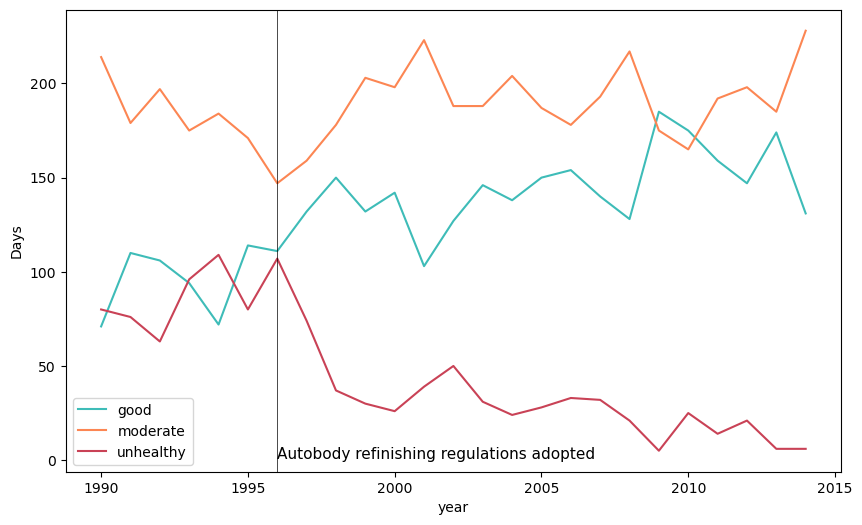

In [28]:
# plot three lines in the same graph
fig, ax = plt.subplots(figsize=(10, 6))
aqi_days.plot(x='year', y='good', color='#3EBCB8', ax=ax)
aqi_days.plot(x='year', y='moderate', color='#FC8653', ax=ax)
aqi_days.plot(x='year', y='unhealthy', color='#C94256', ax=ax)

# creata a label for y-axis
plt.ylabel('Days')

# create a verticla line for reference of information
ax.axvline(x=1996, c='k', linewidth=0.5)
ax.text(1996, 1, "Autobody refinishing regulations adopted", ha='left', fontsize=11);

Matplotlib is basically widely used for most of the datasets and cases, as it can plot several types of data in different graph types, 
including line graph, bar chart, histogram, scatter, pie chart, and so on. 

Here I use matplotlib because it is easy to use and can interpret this 'air quality index' dataset quite well, as it is a continuous 
dataset with years and three levels of AQI in each year, which means I can use year as the x-axis and days as y-axis to compare the 
three AQI levels and read the message directly from this line graph. 

# One Seaborn Plot

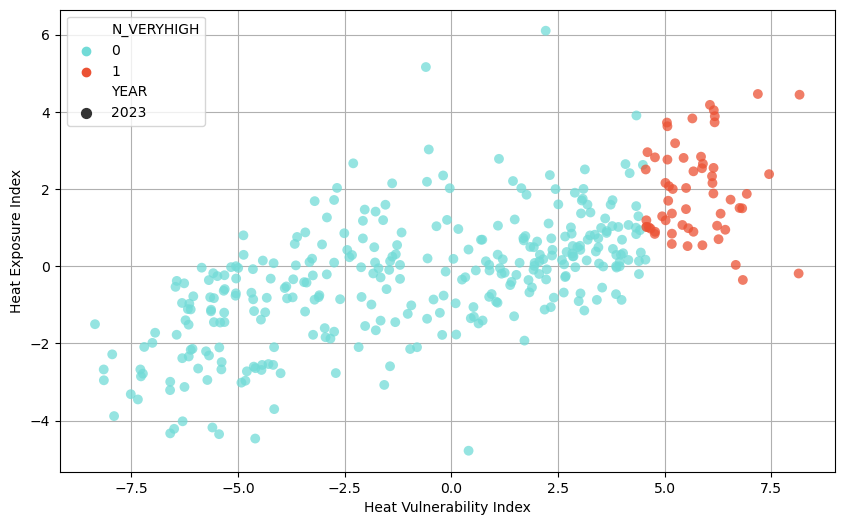

In [53]:
# Initialize the figure and axes
fig, ax = plt.subplots(figsize=(10, 6))

# style keywords as dict
color_map = {1: "#EB5234", 0: "#72DBD7"}
style = dict(palette=color_map, s=60, edgecolor="none", alpha=0.75, zorder=10)

# use the seaborn scatterplot() function
sns.scatterplot(
    x="HVI_SCORE", # the x column
    y="HEI_SCORE", # the y column
    hue="N_VERYHIGH", # the third dimension (color)
    size="YEAR",
    sizes=[50],
    data=heat_index, # pass in the data
    ax=ax, # plot on the axes object we made
    **style # add our style keywords
)


# Format with matplotlib commands
ax.set_xlabel("Heat Vulnerability Index" )
ax.set_ylabel("Heat Exposure Index")
ax.grid(True)
ax.legend(loc='best')

Seaborn is a great tool when you are trying to do visualization for statistical analysis, which can create colorful and informative 
graphs that can be used for showing statistical results, with short and easy code. For this one, the better way to do it is to use 
sns.lmplot() or sns.regplot(), which could make scatter with a fitted line, and that only requires one line of code. 

# Three Altair Plots

In [41]:
# Create the selection box
brush = alt.selection_interval()


(
    alt.Chart(heat_index)  # Create the chart
    .mark_point()  # Use point markers
    .encode(  # Encode
        x=alt.X("HVI_SCORE", scale=alt.Scale(zero=False)),  # X
        y=alt.Y("HEI_SCORE", scale=alt.Scale(zero=False)),  # Y
        # NEW: Use a conditional color based on brush
        color=alt.condition(brush, "N_VERYHIGH", alt.value("lightgray")),  # Color
        tooltip=["N_VERYHIGH", "HVI_SCORE", "HEI_SCORE"],  # Tooltip
    )
    .add_params(brush)  # NEW: Add brush parameter
    .properties(width=200, height=200)  # Set width/height
    .facet(column="N_VERYHIGH") # Facet
)

alt.FacetChart(...)

These are the separate scatter plots of HEI versus HVI scores, separated by "Number of Very High Scores" category

In [21]:
# Setup the selection brush
brush = alt.selection_interval()

# Setup the chart
(
    alt.Chart(heat_index)
    .mark_circle()
    .encode(
        x=alt.X(alt.repeat("column"), type="quantitative", scale=alt.Scale(zero=False)),
        y=alt.Y(alt.repeat("row"), type="quantitative", scale=alt.Scale(zero=False)),
        color=alt.condition(
            brush, "N_VERYHIGH:N", alt.value("lightgray")
        ),  # conditional color
    )
    .properties(
        width=200,
        height=200,
    )
    .add_params(brush)
    .repeat(  # repeat variables across rows and columns
        row=["HSI_SCORE", "HEI_SCORE", "HVI_SCORE"],
        column=["HVI_SCORE", "HEI_SCORE", "HSI_SCORE"],
    )
)

alt.RepeatChart(...)

These are the correlation graphs for HVI, HEI, and HSI, which stands for **heat vulnerability index**, **heat exposure index**, and 
**heat sensitivity index** respectively. 

### *shooting dataset*

In [199]:
# plot the bar chart showing victim's sex from 2015-2023
(
    alt.Chart(shooting_5000)
    .mark_bar()
    .encode(
        # X should show the (normalized) count of each group
        x=alt.X("*:Q", aggregate="count", stack="normalize"), # The * is a placeholder here
        y="year:N",
        color="sex:N",
        tooltip=["year", "sex", "count(*):Q"],
    )
)

alt.Chart(...)

Clearly, Male victims are much more than female victims

In [140]:
# plot the barchart showing shooting victims race and counts from 2015-2023
alt.Chart(shooting_5000).mark_bar(
    cornerRadiusTopLeft=3,
    cornerRadiusTopRight=3
).encode(
    x='year:O',
    y='count():Q',
    color='race:N'
)

alt.Chart(...)

Black ethnic group are the greatest victim, and shooting cases are clearly higher during the Covid years. 

In [103]:
# groupby the dataset and sum up fatal shooting case numbers
shooting_groupby = shooting_5000.groupby(["year", "wound"], as_index=False)["fatal"].sum()
# drop the 0 values
shooting_group = shooting_groupby[shooting_groupby.loc[:]!=0].dropna()

In [127]:
# plot the circle graph with color intensity of fatal cases with different shooting wounds during 2015-2023
alt.Chart(shooting_group).mark_circle().encode(
    alt.X('year').bin(maxbins=35),
    alt.Y('wound'),#.bin(),
    size='fatal',
    color='fatal:Q'
).properties(width=600, height=500)

alt.Chart(...)

victim's wound information and counts of these wounds lead to fatal shooting from year 2015-2023. 

In [195]:
# Setup a brush selection
brush = alt.selection_interval()

# Plot the point plot first, set X Y and size, color
points = alt.Chart().mark_point().encode(
    alt.X('year:Q').title('year').bin(),
    alt.Y('age_diff:Q').title('age difference to mean age').bin(),
    color=alt.condition(brush, 'year:N', alt.value('lightgray')),
    size=alt.Size('age:Q')#.scale(range=[1, 60])
).transform_joinaggregate(
    age_max="max(age)", age_min="min(age)", age_mean="mean(age)", age_median="median(age)"
).transform_calculate(
    age_range="datum.age_max-datum.age_min",
    age_diff="datum.age-datum.age_mean"
).properties(
    width=400,
    height=400
).add_params(
    brush
)

# Then plot the bar chart
bars = alt.Chart().mark_bar().encode(
    x='count()',
    y='dist:N',
    color=alt.Color('dist:N'),#.scale(scale),
# ).transform_calculate(
#     "count", "datum.inside+datum.outside"
).transform_filter(
    brush
).properties(
    width=600
)


alt.vconcat(points, bars, data=shooting_5000)


alt.VConcatChart(...)

Point chart shows the age difference (age minus mean age) in different years; 

Bar chart shows the count of records of the distance of shooting (how far away being shoot)

In [198]:
# Plot a line graph
(
    alt.Chart(shooting_5000.dropna())
    .mark_line()
    .encode(
        x=alt.X("year:Q", bin=alt.Bin(maxbins=10)), # Bin the data!
        y=alt.Y(
            "mean(age):Q", scale=alt.Scale(zero=False) # Mean of flipper length
        ),  
        color="race:N",
        tooltip=["mean(age):Q", "count():Q"],
    )
    .properties(height=300, width=500)
)

alt.Chart(...)

This line graph demonstrates the victim's mean age and race, from year of 2015-2023. 

Asian victims have higher average age

In [197]:
# Setup a brush selection
brush = alt.selection_interval()

# The top scatterplot: flipper length vs bill length
points = (
    alt.Chart()
    .mark_point()
    .encode(
        x=alt.X("point_x:Q", scale=alt.Scale(zero=False)),
        y=alt.Y("point_y:Q", scale=alt.Scale(zero=False)),
        color=alt.condition(brush, "race:N", alt.value("lightgray")),
    )
    .properties(width=800)
    .add_params(brush)
)

# The bottom bar plot
bars = (
    alt.Chart()
    .mark_bar()
    .encode(
        x="count(race):Q",
        y="race:N",
        color="race:N",
    )
    .transform_filter(
        brush  # NEW: the filter transform uses the selection to filter the input data to this chart
    )
    .properties(width=800)
)

# Final chart is a vertical stack
chart = alt.vconcat(points, bars, data=shooting_5000)

# Output the chart
chart

alt.VConcatChart(...)

scatter plot shows coordinate x y and the race of victims. Some regions with really dense dots are the locations that 
frequently occuring shooting events. 

The bar chart shows races of the victims by counts